In [204]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [205]:
from decode_fish.imports import *
from decode_fish.funcs.file_io import *
from decode_fish.funcs.emitter_io import *
from decode_fish.funcs.utils import *
from decode_fish.funcs.matching import *
from decode_fish.funcs.plotting import *
from torch.utils.data import DataLoader
from decode_fish.funcs.routines import *
import seaborn as sns
from decode_fish.funcs.matching import matching

import h5py

In [208]:
filename =  'coloc_file_f1_psfn_5'
filename =  'coloc_file_sep_models_3'

with h5py.File(f'../data/results/{filename}.hdf5', 'r') as f:
    print(f['evaluations'].keys())
    
    dec_df_0 = get_df_from_hdf5(f['localizations']['dec_0'])
    dec_df_1 = get_df_from_hdf5(f['localizations']['dec_1'])
    
    fq_df_0 = get_df_from_hdf5(f['localizations']['fq_0'])
    fq_df_1 = get_df_from_hdf5(f['localizations']['fq_1'])
    
    print(len(dec_df_0), len(dec_df_1))
    print(len(fq_df_0), len(fq_df_1))
    
    print('Full')
    display(get_df_from_hdf5(f['evaluations']['fq_full']))
    display(get_df_from_hdf5(f['evaluations']['dec_full']))
    print('Filt')
    display(get_df_from_hdf5(f['evaluations']['dec_filt']))
    
    dec_full_pimg = get_df_from_hdf5(f['evaluations']['dec_full_pimg'])
    dec_filt_pimg = get_df_from_hdf5(f['evaluations']['dec_filt_pimg'])
    fq_filt_pimg = get_df_from_hdf5(f['evaluations']['fq_full_pimg'])

<KeysViewHDF5 ['dec_filt', 'dec_filt_pimg', 'dec_full', 'dec_full_pimg', 'fq_full', 'fq_full_pimg']>
28912 45928
25263 24351
Full


,eff_3d,jaccard,n_matches,precision,recall,rmse_vol,rmse_x,rmse_y,rmse_z
0,31.878899,0.690368,20263,0.832122,0.802082,121.355124,65.471702,63.875942,79.752031


,eff_3d,jaccard,n_matches,precision,recall,rmse_vol,rmse_x,rmse_y,rmse_z
0,36.912712,0.510058,25279,0.550405,0.874343,79.487792,42.765751,45.246214,49.418414


Filt


,eff_3d,jaccard,n_matches,precision,recall,rmse_vol,rmse_x,rmse_y,rmse_z
0,56.419698,0.743839,21552,0.853105,0.853105,70.514103,38.988617,40.284025,42.770596


In [215]:
dec_full_pimg[11:]

,eff_3d,jaccard,n_matches,precision,recall,rmse_vol,rmse_x,rmse_y,rmse_z
11,54.316440,0.763534,3526,0.826535,0.909232,78.174825,43.181323,43.051252,48.921022
12,57.167576,0.794264,3517,0.873789,0.897194,75.135675,41.282017,40.834391,47.683511
13,54.770803,0.730636,2745,0.805694,0.886914,72.666670,39.427982,43.389504,42.932856
14,55.896974,0.809707,2319,0.887146,0.902686,79.572892,38.494133,37.786846,58.499583
15,57.451031,0.784922,3186,0.859687,0.900254,73.425631,40.094401,42.534449,44.436280
16,59.104487,0.787762,1841,0.868396,0.894558,69.914043,37.644495,39.464327,43.742798


In [217]:
fq_filt_pimg[11:]

,eff_3d,jaccard,n_matches,precision,recall,rmse_vol,rmse_x,rmse_y,rmse_z
11,31.200663,0.762053,3177,0.852200,0.878109,129.107120,70.388479,68.444824,83.841615
12,36.278491,0.786881,3227,0.887758,0.873815,120.103863,63.948906,63.007123,79.784571
13,36.577220,0.774796,2570,0.864447,0.881949,118.579638,63.436630,62.403099,78.375875
14,32.009572,0.722846,1930,0.861223,0.818143,124.170158,65.503301,61.840027,85.459679
15,32.690218,0.732204,2767,0.847473,0.843340,123.506455,67.764007,64.267556,80.818099
16,25.304164,0.621769,1251,0.807618,0.729872,128.823654,72.446343,70.521864,79.835632


In [229]:
ret_matches = DF()
bins_xy = 11000 
bins_z = 20000

dec_perfs = []
fq_perfs = []
ds = []
fs = []

for i in range(14,17):
    
    sub_dec = dec_df_0[dec_df_0['frame_idx'] == i].copy()
    
    n_bins_x = int(sub_dec['x'].max()//bins_xy)+1
    n_bins_y = int(sub_dec['y'].max()//bins_xy)+1
    n_bins_z = int(sub_dec['z'].max()//bins_z)+1
    
    print(n_bins_x,n_bins_y,n_bins_z)

    for x in range(n_bins_x):
        for y in range(n_bins_y):
            for z in range(n_bins_z):
                
                sl = np.s_[i:i+1,z*bins_z:(z+1)*bins_z,y*bins_xy:(y+1)*bins_xy,x*bins_xy:(x+1)*bins_xy]
                ds.append(len(crop_df(dec_df_0, sl)))
                fs.append(len(crop_df(fq_df_0, sl)))
                
                perf_df_dec, _, _ = matching(crop_df(dec_df_0, sl), crop_df(dec_df_1, sl), print_res=False)
                perf_df_fq, _, _ = matching(crop_df(fq_df_0, sl), crop_df(fq_df_1, sl), print_res=False)
                
                dec_perfs.append(perf_df_dec)
                fq_perfs.append(perf_df_fq)


5 5 1
5 5 1
5 5 1


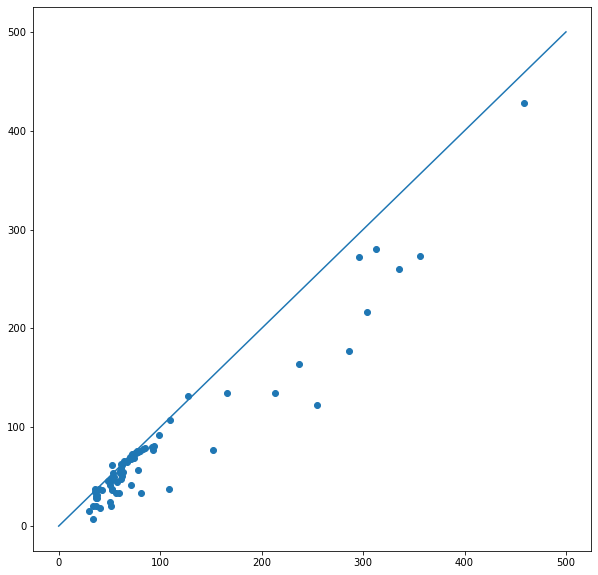

In [230]:
plt.figure(figsize=(10,10))
plt.scatter([p['n_matches'] for p in dec_perfs],[p['n_matches'] for p in fq_perfs])
plt.plot([0,500],[0,500])

(0.6, 1.5)

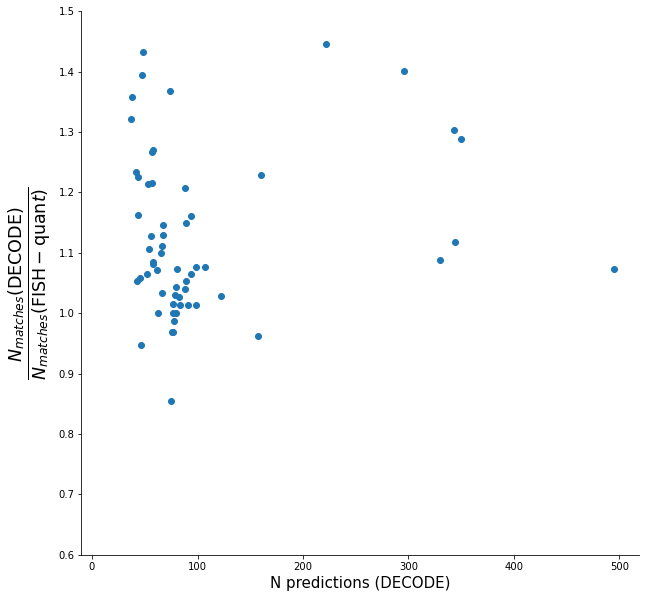

In [231]:
plt.figure(figsize=(10,10))
plt.scatter(fs, [p['n_matches']/f['n_matches'] for p,f in zip(dec_perfs,fq_perfs)])
plt.xlabel('N predictions (DECODE)', fontsize=15)
plt.ylabel(r'$\frac{N_{matches} (\mathrm{DECODE})}{N_{matches} (\mathrm{FISH-quan}t)}$', fontsize=25)
sns.despine()
plt.ylim(0.6,1.5)

In [207]:
perf_cross, matches, shift = matching(dec_0_df[dec_0_df['frame_idx']>=11], fq_0_df[fq_0_df['frame_idx']>=11], print_res=True)

KeyboardInterrupt: 

In [ ]:
perf_cross, matches, shift = matching(dec_1_df[dec_1_df['frame_idx']>=11], fq_1_df[fq_1_df['frame_idx']>=11], print_res=True)

In [ ]:
dec_full_pimg.iloc[11:]

In [ ]:
perf_df_dec, matches_dec, shift_dec = matching(dec_0_sub_f, dec_1_sub_f, print_res=False)

In [203]:
for i in range(14,17):

    dec_0_sub = dec_0_df[dec_0_df['frame_idx']==i]
    dec_1_sub = dec_1_df[dec_1_df['frame_idx']==i]  
    
    dec_0_sub = px_to_nm(nm_to_px(dec_0_sub), px_size_zyx=[200,139,139])
    dec_1_sub = px_to_nm(nm_to_px(dec_1_sub), px_size_zyx=[200,139,139])
    
    perf_df_dec, matches_dec, shift_dec = matching(dec_0_sub, dec_1_sub, print_res=False)
    display(DF.from_records([perf_df_dec]))
    print(shift_dec)

,recall,precision,jaccard,rmse_vol,rmse_x,rmse_y,rmse_z,eff_3d,n_matches
0,0.899183,0.883703,0.804038,133.242234,48.203095,48.586679,114.320993,30.556598,2310


[8.602499178271273, 8.238880463802452, -93.97721678498503]


,recall,precision,jaccard,rmse_vol,rmse_x,rmse_y,rmse_z,eff_3d,n_matches
0,0.893755,0.853481,0.774865,104.390113,51.393101,53.18968,73.667516,43.156525,3163


[7.025408049832784, 18.8543459397496, -1.9790486237160811]


,recall,precision,jaccard,rmse_vol,rmse_x,rmse_y,rmse_z,eff_3d,n_matches
0,0.888727,0.862736,0.778629,101.269323,44.842422,49.630219,76.036008,44.73772,1829


[0.2518981925251055, 5.1597379660463, -37.39836518552018]


In [198]:
perf_df_dec

{'recall': 0.9026858348506875,
 'precision': 0.8871461022514879,
 'jaccard': 0.8097066473668542,
 'rmse_vol': 79.57289238718631,
 'rmse_x': 38.49413345697119,
 'rmse_y': 37.786845508156716,
 'rmse_z': 58.4995831276303,
 'eff_3d': 55.89697401221418,
 'n_matches': 2319}

In [199]:
DF.from_records([perf_df_dec])

,recall,precision,jaccard,rmse_vol,rmse_x,rmse_y,rmse_z,eff_3d,n_matches
0,0.902686,0.887146,0.809707,79.572892,38.494133,37.786846,58.499583,55.896974,2319


In [170]:
dec_full_pimg.iloc[11:]

,eff_3d,jaccard,n_matches,precision,recall,rmse_vol,rmse_x,rmse_y,rmse_z
11,54.316440,0.763534,3526,0.826535,0.909232,78.174825,43.181323,43.051252,48.921022
12,57.167576,0.794264,3517,0.873789,0.897194,75.135675,41.282017,40.834391,47.683511
13,54.770803,0.730636,2745,0.805694,0.886914,72.666670,39.427982,43.389504,42.932856
14,55.896974,0.809707,2319,0.887146,0.902686,79.572892,38.494133,37.786846,58.499583
15,57.451031,0.784922,3186,0.859687,0.900254,73.425631,40.094401,42.534449,44.436280
16,59.104487,0.787762,1841,0.868396,0.894558,69.914043,37.644495,39.464327,43.742798


In [171]:
fq_filt_pimg.iloc[11:]

,eff_3d,jaccard,n_matches,precision,recall,rmse_vol,rmse_x,rmse_y,rmse_z
11,31.200663,0.762053,3177,0.852200,0.878109,129.107120,70.388479,68.444824,83.841615
12,36.278491,0.786881,3227,0.887758,0.873815,120.103863,63.948906,63.007123,79.784571
13,36.577220,0.774796,2570,0.864447,0.881949,118.579638,63.436630,62.403099,78.375875
14,32.009572,0.722846,1930,0.861223,0.818143,124.170158,65.503301,61.840027,85.459679
15,32.690218,0.732204,2767,0.847473,0.843340,123.506455,67.764007,64.267556,80.818099
16,25.304164,0.621769,1251,0.807618,0.729872,128.823654,72.446343,70.521864,79.835632


In [172]:
for i in range(11,17):
    sub_0 = fq_0_df[fq_0_df['frame_idx']==i]
    sub_1 = fq_1_df[fq_1_df['frame_idx']==i]
    
    print(i, Path(image_paths[i]).name, len(sub_0), len(sub_1))

11 20170326_dlgYFP_YFPATTO647N_dlg570_p3s3l.ome.tiff 3618 3728
12 20170326_dlgYFP_YFPATTO647N_dlg570_p3s3r.ome.tiff 3693 3635
13 20170326_dlgYFP_YFPATTO647N_dlg570_p3s4l.ome.tiff 2914 2973
14 20170326_dlgYFP_YFPATTO647N_dlg570_p3s4r.ome.tiff 2359 2241
15 20170326_dlgYFP_YFPATTO647N_dlg570_p3s5l.ome.tiff 3281 3265
16 20170326_dlgYFP_YFPATTO647N_dlg570_p3s5r.ome.tiff 1714 1549


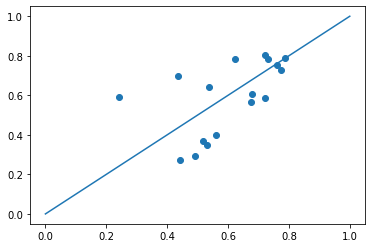

In [118]:
plt.scatter(fq_filt_pimg['jaccard'],dec_full_pimg['jaccard'])
plt.plot([0,1],[0,1])

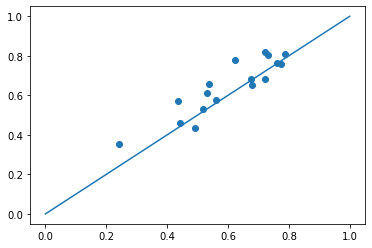

In [117]:
plt.scatter(fq_filt_pimg['jaccard'],dec_filt_pimg['jaccard'])
plt.plot([0,1],[0,1])

In [10]:
base_dir = '/groups/turaga/home/speisera/Mackebox/Artur/WorkDB/deepstorm/datasets/CodFish/raw_data_for_codetection'
image_paths = sorted(glob.glob(str(Path(base_dir + '/*.tiff'))))
# image_paths

In [168]:
dec_full_pimg.iloc[11:]

,eff_3d,jaccard,n_matches,precision,recall,rmse_vol,rmse_x,rmse_y,rmse_z
11,54.316440,0.763534,3526,0.826535,0.909232,78.174825,43.181323,43.051252,48.921022
12,57.167576,0.794264,3517,0.873789,0.897194,75.135675,41.282017,40.834391,47.683511
13,54.770803,0.730636,2745,0.805694,0.886914,72.666670,39.427982,43.389504,42.932856
14,55.896974,0.809707,2319,0.887146,0.902686,79.572892,38.494133,37.786846,58.499583
15,57.451031,0.784922,3186,0.859687,0.900254,73.425631,40.094401,42.534449,44.436280
16,59.104487,0.787762,1841,0.868396,0.894558,69.914043,37.644495,39.464327,43.742798


In [167]:
dec_full_pimg.iloc[11:]

NameError: name 'fq_full_pimg' is not defined

In [157]:
DF(dec_full_pimg[['jaccard','n_matches','precision','recall']].iloc[2]).transpose()

,jaccard,n_matches,precision,recall
2,0.583241,1058.0,0.629762,0.887584


FQ


,jaccard,n_matches,precision,recall
11,0.762053,3177.0,0.8522,0.878109


DEC Full


,jaccard,n_matches,precision,recall
11,0.763534,3526.0,0.826535,0.909232


DEC Filt


,jaccard,n_matches,precision,recall
11,0.808096,3234.0,0.893864,0.893864


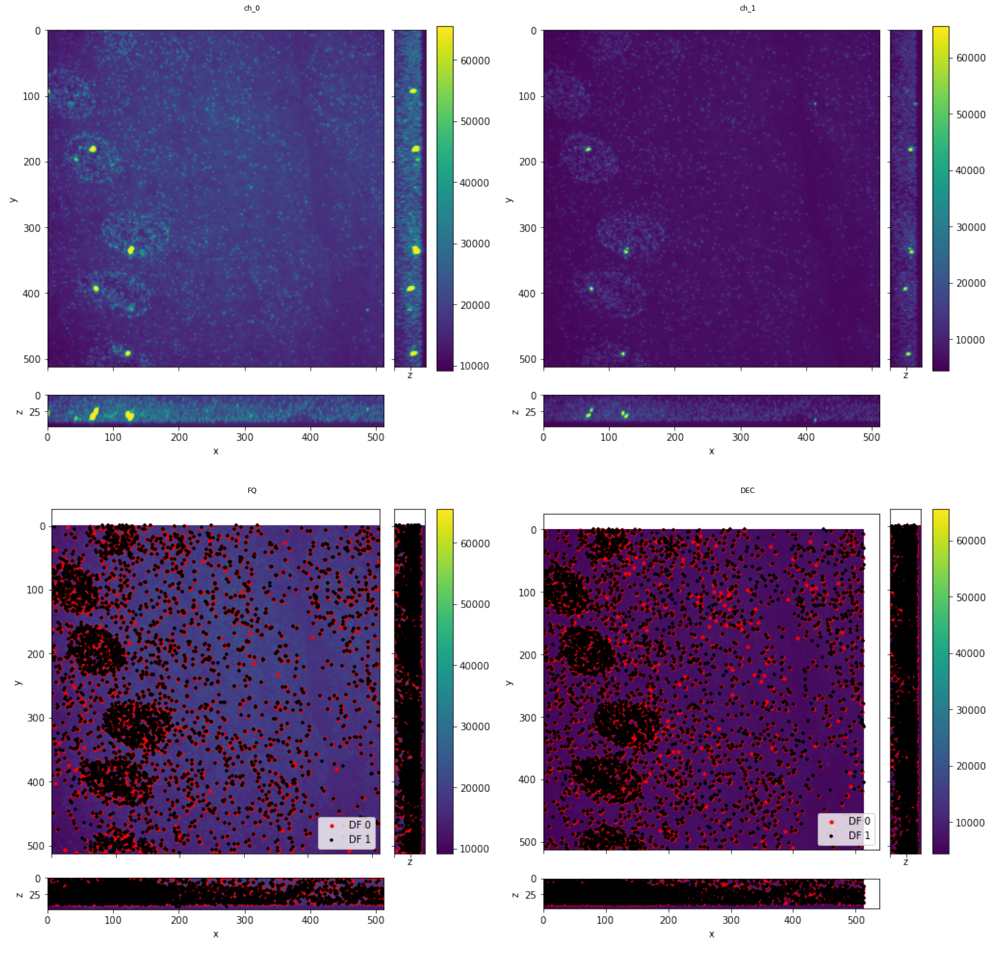

FQ


,jaccard,n_matches,precision,recall
12,0.786881,3227.0,0.887758,0.873815


DEC Full


,jaccard,n_matches,precision,recall
12,0.794264,3517.0,0.873789,0.897194


DEC Filt


,jaccard,n_matches,precision,recall
12,0.81966,3327.0,0.900894,0.900894


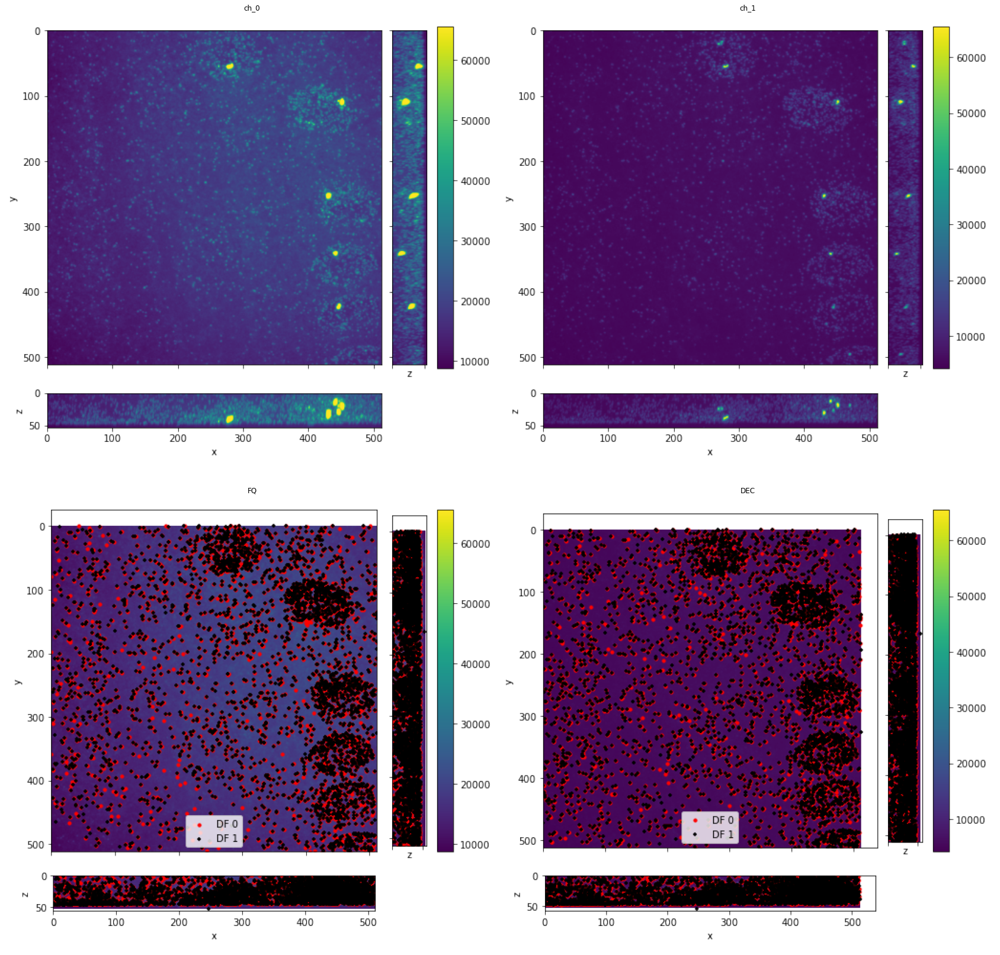

FQ


,jaccard,n_matches,precision,recall
13,0.774796,2570.0,0.864447,0.881949


DEC Full


,jaccard,n_matches,precision,recall
13,0.730636,2745.0,0.805694,0.886914


DEC Filt


,jaccard,n_matches,precision,recall
13,0.785539,2564.0,0.87989,0.87989


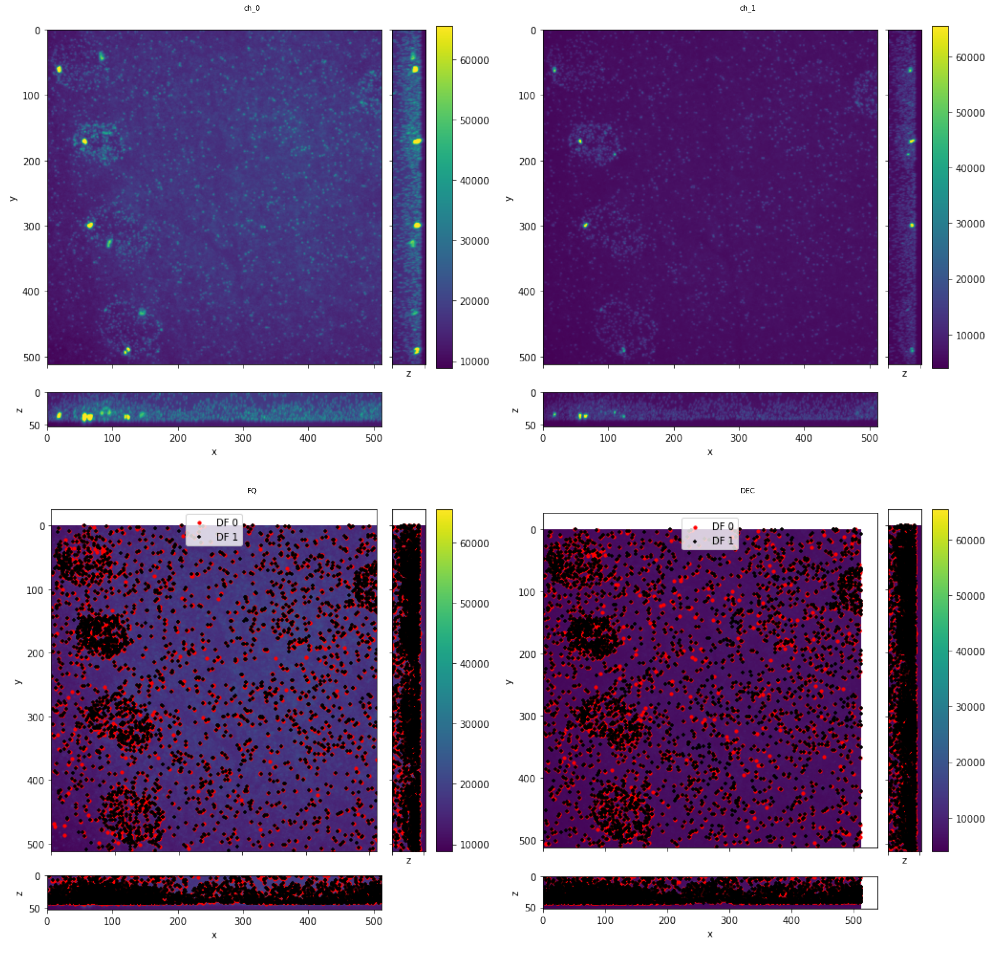

FQ


,jaccard,n_matches,precision,recall
14,0.722846,1930.0,0.861223,0.818143


DEC Full


,jaccard,n_matches,precision,recall
14,0.809707,2319.0,0.887146,0.902686


DEC Filt


,jaccard,n_matches,precision,recall
14,0.848746,2166.0,0.918186,0.918186


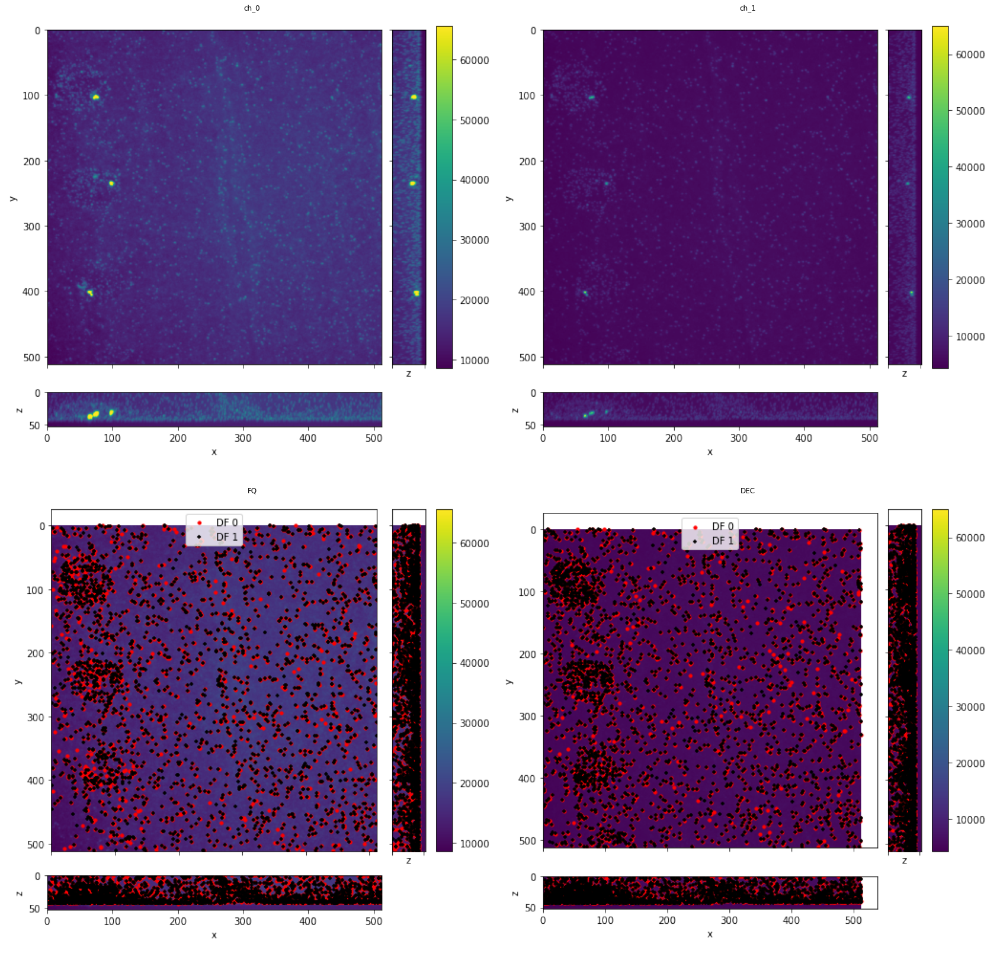

FQ


,jaccard,n_matches,precision,recall
15,0.732204,2767.0,0.847473,0.84334


DEC Full


,jaccard,n_matches,precision,recall
15,0.784922,3186.0,0.859687,0.900254


DEC Filt


,jaccard,n_matches,precision,recall
15,0.835011,2986.0,0.910088,0.910088


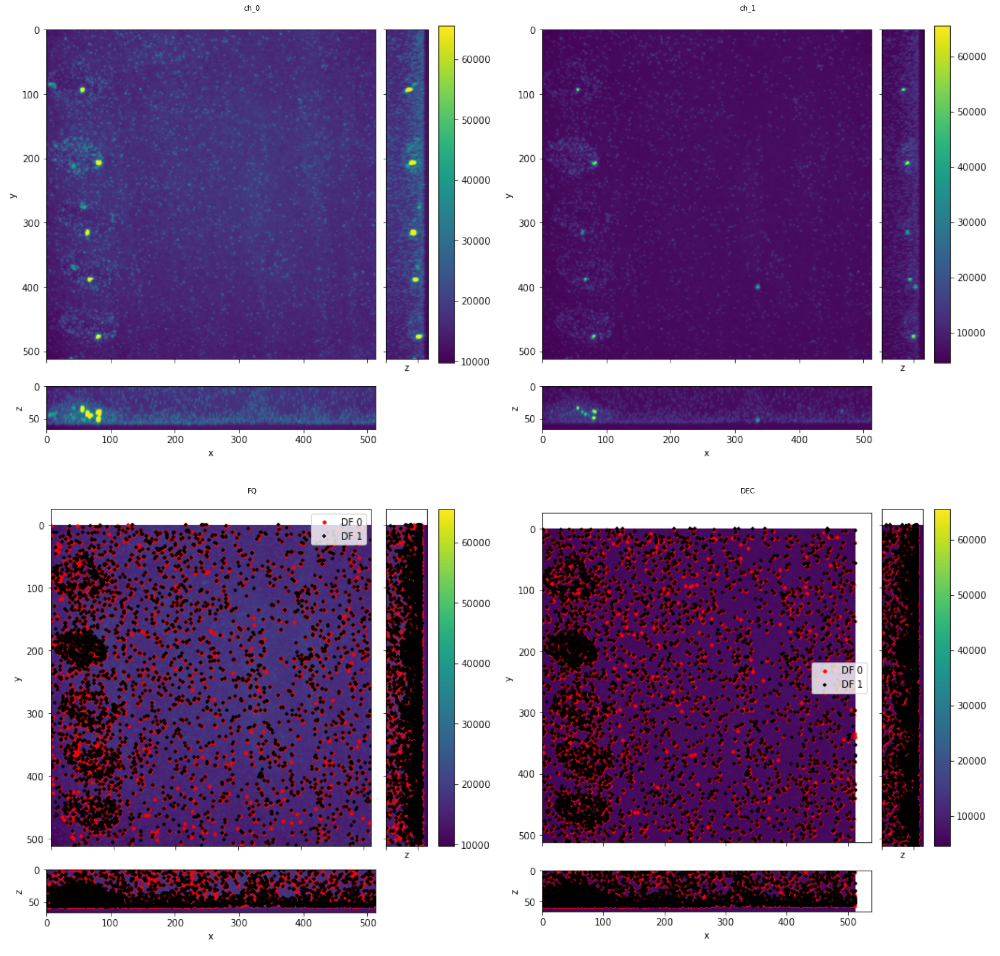

FQ


,jaccard,n_matches,precision,recall
16,0.621769,1251.0,0.807618,0.729872


DEC Full


,jaccard,n_matches,precision,recall
16,0.787762,1841.0,0.868396,0.894558


DEC Filt


,jaccard,n_matches,precision,recall
16,0.810882,1535.0,0.895566,0.895566


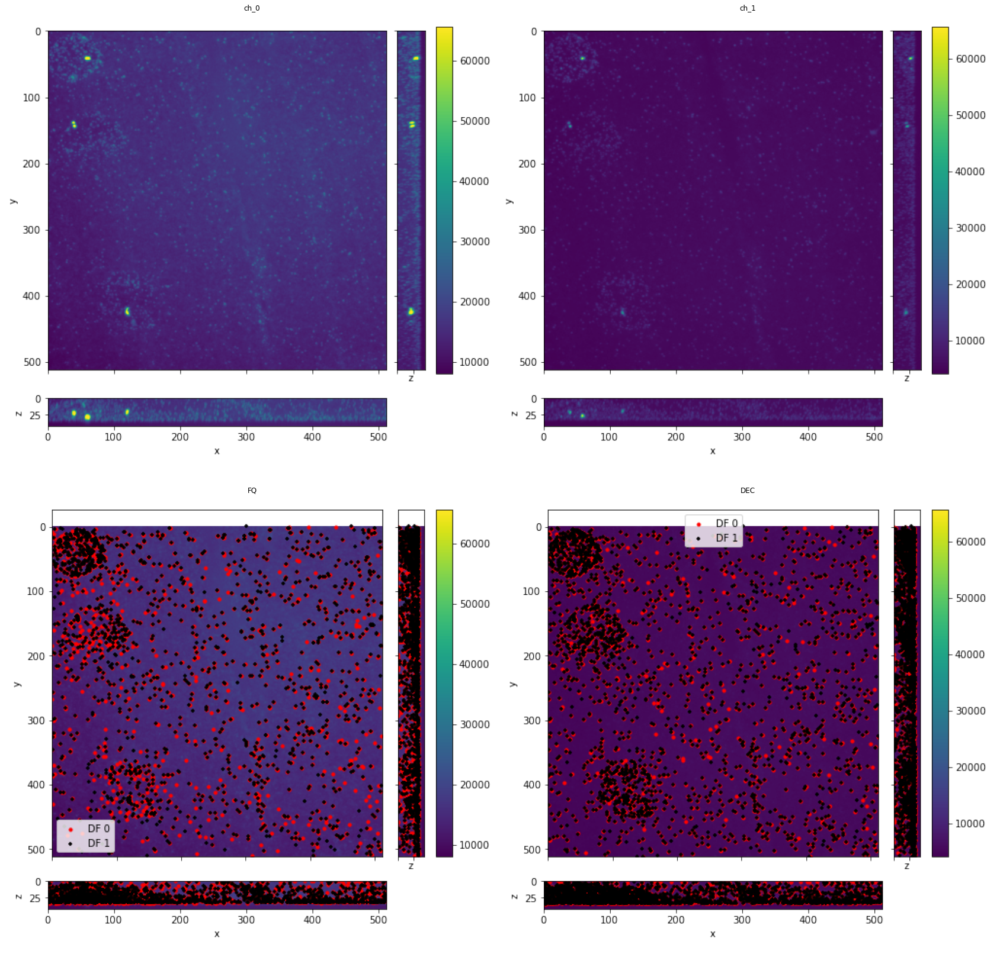

In [186]:
sl = np.s_[:,:,100:200,100:200]
sl = np.s_[:,:,:,:]

for i in range(11, 17):

    print('FQ')
    display(DF(fq_filt_pimg[['jaccard','n_matches','precision','recall']].iloc[i]).transpose())
    print('DEC Full')
    display(DF(dec_full_pimg[['jaccard','n_matches','precision','recall']].iloc[i]).transpose())
    print('DEC Filt')
    display(DF(dec_filt_pimg[['jaccard','n_matches','precision','recall']].iloc[i]).transpose())

    img = load_tiff_image(image_paths[i])[sl]
    fig1,_ = plot_3d_projections(img[0], display=False)
    fig2,_ = plot_3d_projections(img[1], display=False)
    fig3,axes = plot_3d_projections(img[0], display=False)
    
    fq0 = crop_df(nm_to_px(fq_0_df[fq_0_df['frame_idx']==i]),sl)
    fq1 = crop_df(nm_to_px(fq_1_df[fq_1_df['frame_idx']==i]),sl)
    
    dec0 = crop_df(nm_to_px(dec_0_df[dec_0_df['frame_idx']==i]),sl)
    dec1 = crop_df(nm_to_px(dec_1_df[dec_1_df['frame_idx']==i]),sl)    
    
    scat_3d_projections(axes, [fq0, fq1])
    fig4,axes = plot_3d_projections(img[1], display=False)
    scat_3d_projections(axes, [dec0, dec1])
    _ =combine_figures([fig1,fig2,fig3, fig4],['ch_0','ch_1','FQ','DEC'], figsize=(30,30), ncols=2, nrows=2)
    plt.show()

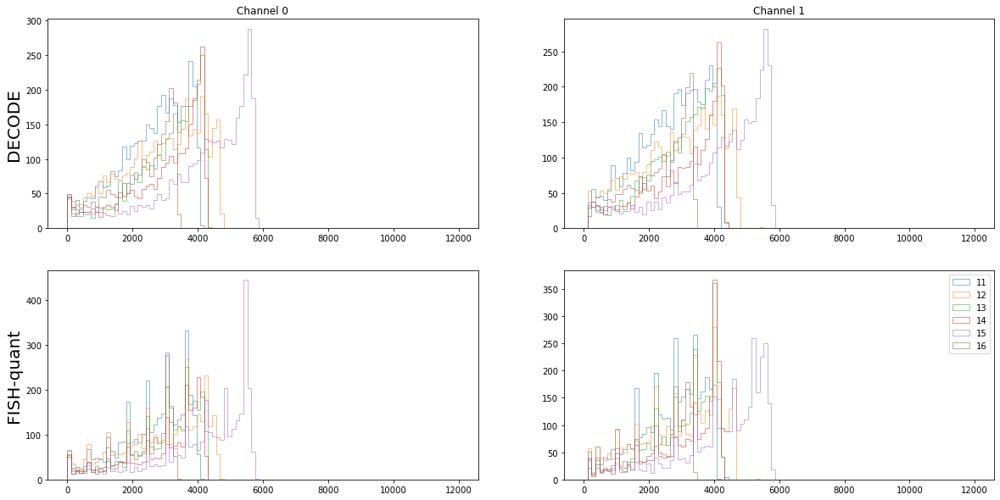

In [185]:
plt.figure(figsize=(20,10))

for i in range(11,17):
    
    dec_0_sub = dec_0_df[dec_0_df['frame_idx']==i]
    dec_1_sub = dec_1_df[dec_1_df['frame_idx']==i]

    fq_0_sub = fq_0_df[fq_0_df['frame_idx']==i]
    fq_1_sub = fq_1_df[fq_1_df['frame_idx']==i]

    plt.subplot(221)
    _=plt.hist(dec_0_sub['z'], alpha=0.5, bins=np.linspace(0,12000,101), histtype='step', density=False)

    plt.ylabel('DECODE', fontsize=20)
    plt.title('Channel 0')
    
    plt.subplot(222)
    _=plt.hist(dec_1_sub['z'], alpha=0.5, bins=np.linspace(0,12000,101), histtype='step', density=False)
    
    plt.title('Channel 1')
    
    plt.subplot(223)
    _=plt.hist(fq_0_sub['z'], alpha=0.5, bins=np.linspace(0,12000,101), histtype='step', density=False)
    
    plt.ylabel('FISH-quant', fontsize=20)

    plt.subplot(224)
    _=plt.hist(fq_1_sub['z'], alpha=0.5, bins=np.linspace(0,12000,101), histtype='step', density=False, label = i)
    
plt.legend()

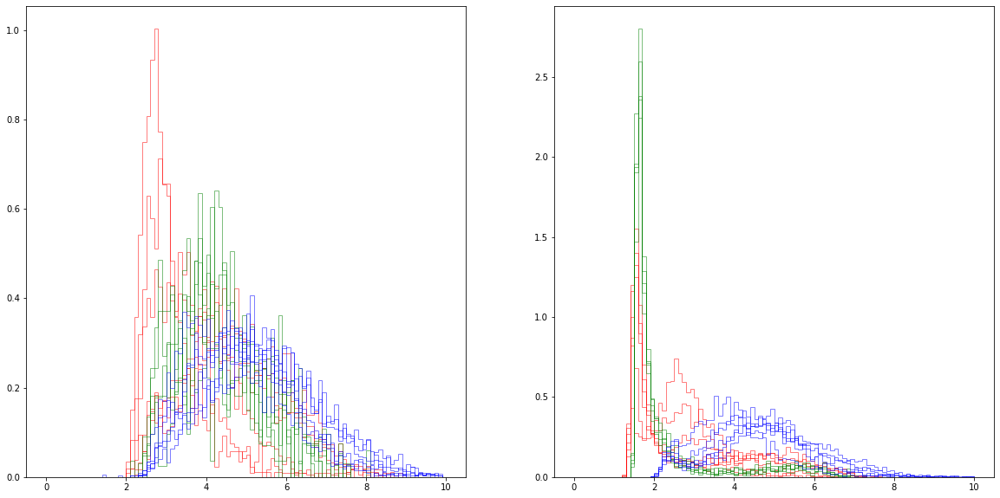

In [121]:
plt.figure(figsize=(20,10))

for i in range(17):
    dec_0_sub = dec_0_df[dec_0_df['frame_idx']==i]
    dec_1_sub = dec_1_df[dec_1_df['frame_idx']==i]
#     dec_1_sub_f = dec_1_df_filt[dec_1_df_filt['frame_idx']==i]

    if 'p1' in image_paths[i][-20:]:
        col = 'red'
    if 'p2' in image_paths[i][-20:]:
        col = 'green'
    if 'p3' in image_paths[i][-20:]:
        col = 'blue'

    plt.subplot(121)
    _=plt.hist(dec_0_sub['int'], alpha=0.5, bins=np.linspace(0,10,101), histtype='step', density=True, color=col)

    plt.subplot(122)
    _=plt.hist(dec_1_sub['int'], alpha=0.5, bins=np.linspace(0,10,101), histtype='step', density=True, color=col)

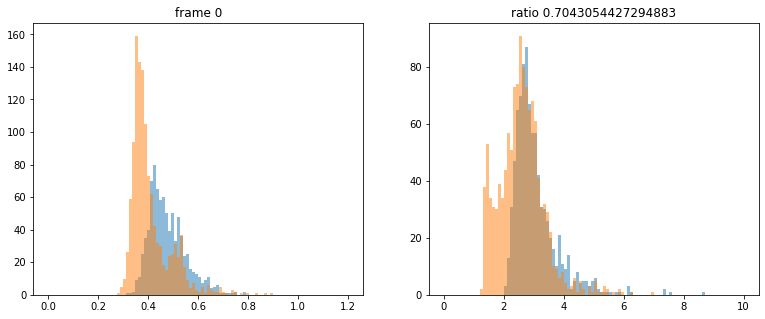

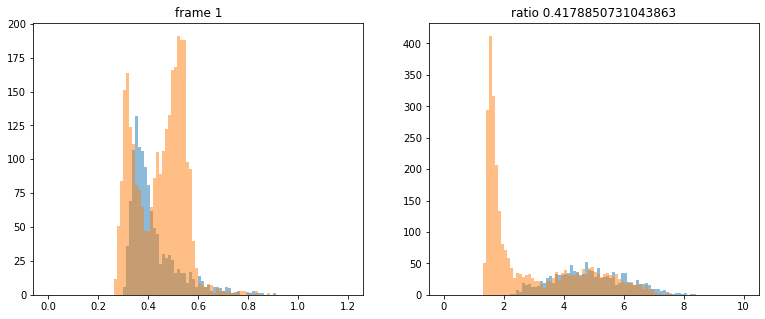

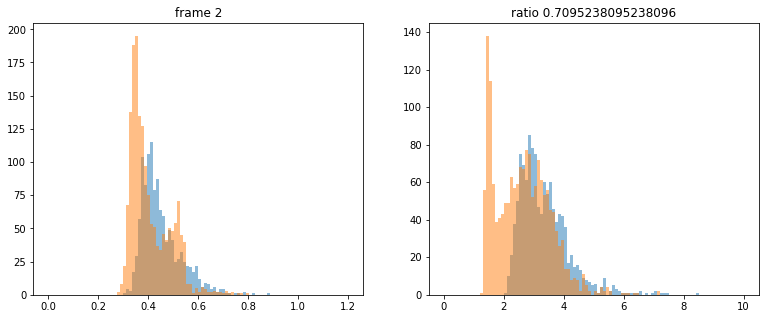

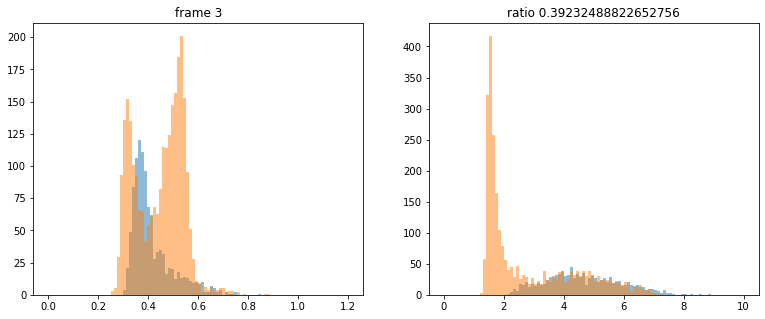

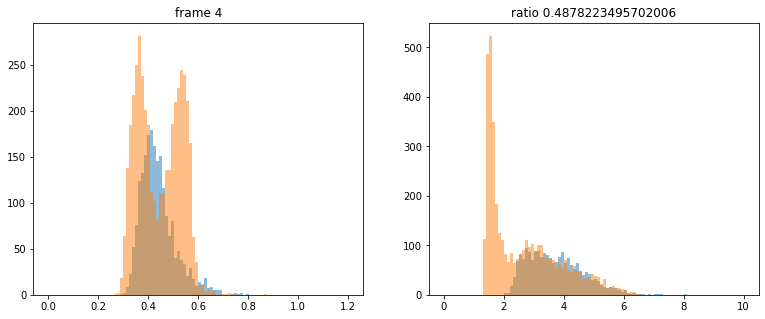

...

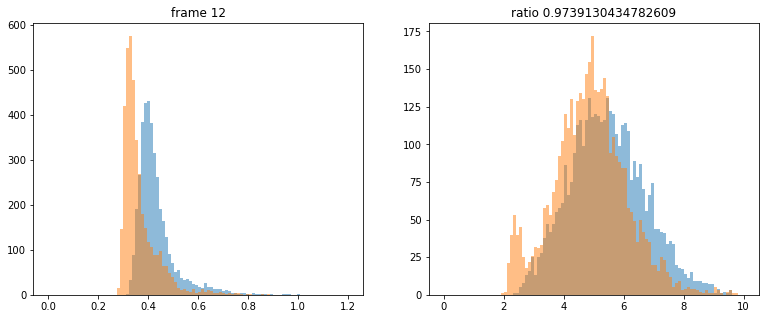

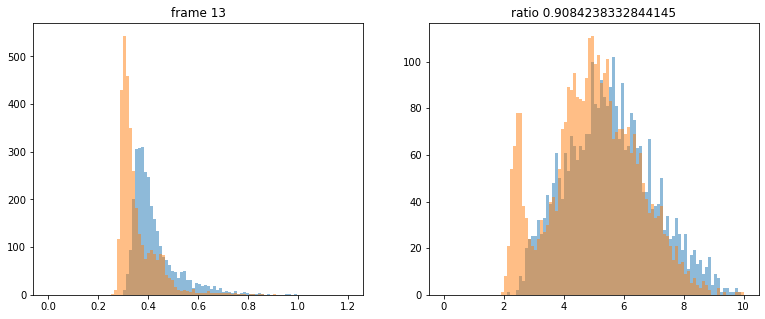

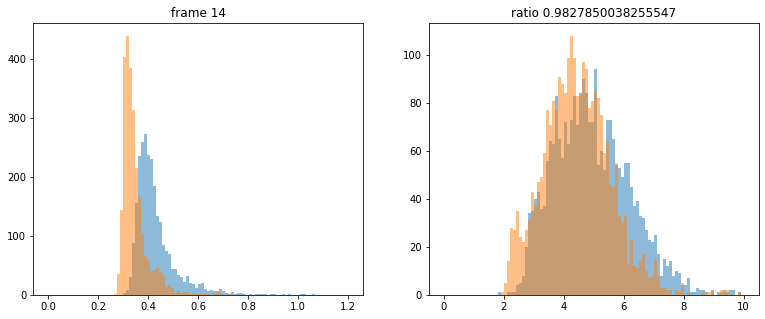

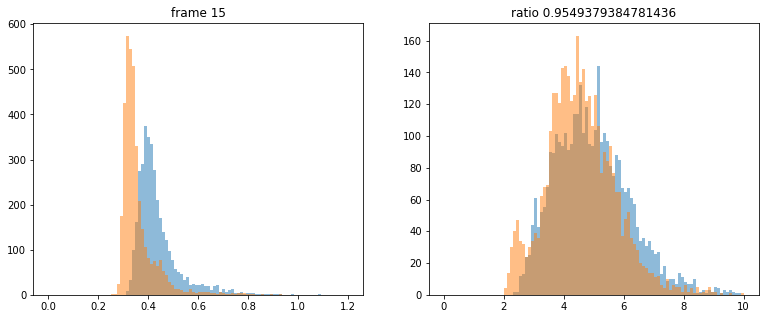

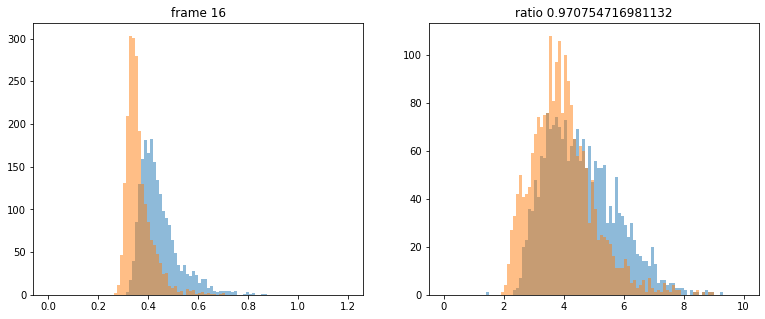

In [122]:
for i in range(17):
    plt.figure(figsize=(13,5))
    dec_0_sub = dec_0_df[dec_0_df['frame_idx']==i]
    dec_1_sub = dec_1_df[dec_1_df['frame_idx']==i]
#     dec_1_sub_f = dec_1_df_filt[dec_1_df_filt['frame_idx']==i]
    
    plt.subplot(121)
    _=plt.hist(dec_0_sub['comb_sig'], alpha=0.5, bins=np.linspace(0,1.2,101))
    _=plt.hist(dec_1_sub['comb_sig'], alpha=0.5, bins=np.linspace(0,1.2,101))
#     _=plt.hist(dec_1_sub_f['comb_sig'], alpha=0.5, bins=np.linspace(0,1.2,101))
    plt.title(f'frame {i}')
    plt.subplot(122)
    _=plt.hist(dec_0_sub['int'], alpha=0.5, bins=np.linspace(0,10,101))
    _=plt.hist(dec_1_sub['int'], alpha=0.5, bins=np.linspace(0,10,101))
#     _=plt.hist(dec_1_sub_f['int'], alpha=0.5, bins=np.linspace(0,10,101))
    plt.title(f'ratio {len(dec_0_sub)/len(dec_1_sub)}')
    plt.show()

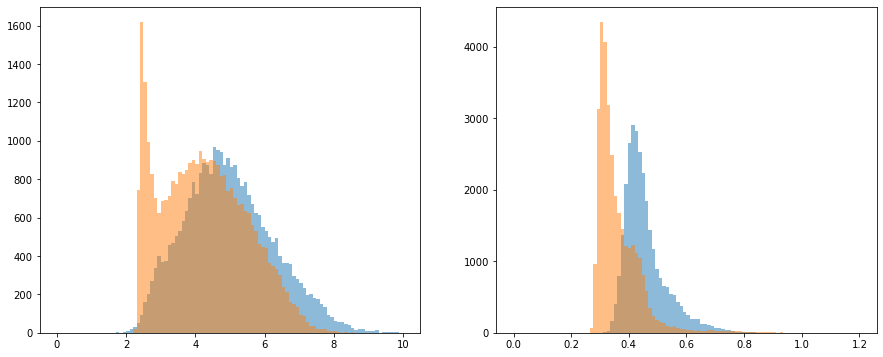

In [9]:
plt.figure(figsize=(15,6))
plt.subplot(121)
_=plt.hist(dec_0_df['int'], alpha=0.5, bins=np.linspace(0,10,101))
_=plt.hist(dec_1_df['int'], alpha=0.5, bins=np.linspace(0,10,101))
plt.subplot(122)
_=plt.hist(dec_0_df['comb_sig'], alpha=0.5, bins=np.linspace(0,1.2,101))
_=plt.hist(dec_1_df['comb_sig'], alpha=0.5, bins=np.linspace(0,1.2,101))
# _=plt.hist(dec_1_df_filt['int'], alpha=0.5, bins=np.linspace(0,10,101))

In [90]:
fq_0_df = DF()
fq_1_df = DF()
for g in fq0_paths:
    fq_0_df = append_emitter_df(fq_0_df, big_fishq_to_df(g))
for g in fq1_paths:
    fq_1_df = append_emitter_df(fq_1_df, big_fishq_to_df(g))
    
fq_0_df = px_to_nm(fq_0_df)
fq_1_df = px_to_nm(fq_1_df)

In [91]:
# perf_df, matches, shift = matching(fq_0_df, fq_1_df, print_res=True)

In [92]:
fq_1_df_corr = shift_df(fq_1_df, [60.20,-25.67,144.49])
dec_1_df_corr = shift_df(dec_1_df, [64.44,-28.58,139.19])

In [17]:
def get_match_rmses(match_df):
    rmses = (match_df['x_tar'] - match_df['x_pred'])**2 
    rmses += (match_df['y_tar'] - match_df['y_pred'])**2
    rmses += (match_df['z_tar'] - match_df['z_pred'])**2
    rmses /= 3
    return np.sqrt(rmses)

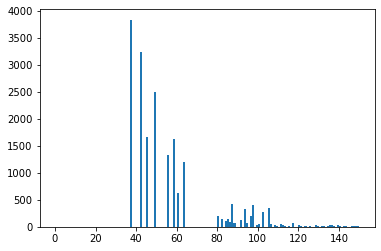

In [18]:
rmses = get_match_rmses(matches)
_ = plt.hist(rmses, bins = np.linspace(0,150,151))

In [24]:
# Recall: 0.846
# Precision: 0.758
# Jaccard: 66.634
# RMSE_vol: 80.905
# Eff_3d: 47.563
# FN: 4496.0 FP: 7886.0
# Shift: 2.76,-2.38,7.75

In [124]:
dec_0_df_filt = DF()
dec_1_df_filt = DF()

perf_dicts_dec = []
perf_dicts_fq = []

for i in range(17):
    
    fq_0_sub = fq_0_df[fq_0_df['frame_idx']==i]
    fq_1_sub = fq_1_df[fq_1_df['frame_idx']==i]
    
    dec_0_sub = dec_0_df[dec_0_df['frame_idx']==i]
    dec_1_sub = dec_1_df_corr[dec_1_df_corr['frame_idx']==i]  
    
    perc0 = len(fq_0_sub)/len(dec_0_sub)
    dec_0_sub_f = filt_perc(dec_0_sub, perc0 * 100)
    dec_0_sub_f = filt_perc(dec_0_sub, 100 - perc0 * 100, metric='int', return_low=False)
    dec_0_sub_f['frame_idx'] = dec_0_sub_f['frame_idx']*0
    dec_0_df_filt = append_emitter_df(dec_0_df_filt, dec_0_sub_f)
    
    perc = len(dec_0_sub_f)/len(dec_1_sub)
    perc = np.clip(perc,0,1)
    dec_1_sub_f = filt_perc(dec_1_sub, perc * 100)
    dec_1_sub_f = filt_perc(dec_1_sub, 100 - perc * 100, metric='int', return_low=False)
    dec_1_sub_f['frame_idx'] = dec_1_sub_f['frame_idx']*0
    dec_1_df_filt = append_emitter_df(dec_1_df_filt, dec_1_sub_f)
    
    perf_df_dec, matches_dec, shift_dec = matching(dec_0_sub_f, dec_1_sub_f, print_res=False)
    perf_df_fq, matches_fq, shift_fq = matching(fq_0_sub, fq_1_sub, print_res=False)
    
    perf_dicts_dec.append(perf_df_dec)
    perf_dicts_fq.append(perf_df_fq)

In [113]:
# perf_df_dec, matches_dec, shift_dec = matching(dec_0_df_filt, dec_1_df_filt, print_res=False)

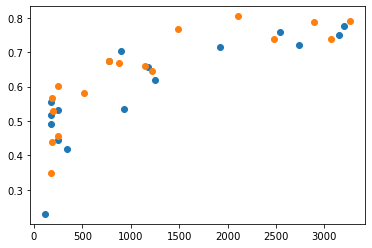

In [115]:
plt.scatter([d['n_matches'] for d in perf_dicts_fq],[d['jaccard'] for d in perf_dicts_fq], label='FQ')
plt.scatter([d['n_matches'] for d in perf_dicts_dec],[d['jaccard'] for d in perf_dicts_dec], label='DECODE')

In [134]:
tra = DF(perf_dicts_dec)

In [147]:
DF.from_records([perf_dicts_dec[0]])

,recall,precision,jaccard,rmse_vol,rmse_x,rmse_y,rmse_z,eff_3d,n_matches
0,0.516224,0.516224,0.347912,83.552886,52.790377,51.107586,39.777831,22.556771,175


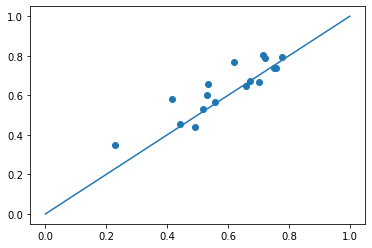

In [123]:
plt.scatter([d['jaccard'] for d in perf_dicts_fq],[d['jaccard'] for d in perf_dicts_dec])
plt.plot([0,1],[0,1])

In [83]:
perf_df_dec, matches_dec, shift_dec = matching(dec_0_df_filt, dec_1_df_filt, print_res=True)

100%|███████████████████████████████████████████████████████████████| 17/17 [02:44<00:00,  9.66s/it]

Recall: 0.846
Precision: 0.846
Jaccard: 73.301
RMSE_vol: 76.159
Eff_3d: 53.493
FN: 3892.0 FP: 3892.0
Shift: 8.85,-0.10,21.99


In [58]:
perf_df, matches, shift = matching(fq_0_df, fq_1_df_corr, print_res=True)

100%|███████████████████████████████████████████████████████████████| 17/17 [02:58<00:00, 10.47s/it]

Recall: 0.802
Precision: 0.832
Jaccard: 69.031
RMSE_vol: 121.965
Eff_3d: 31.604
FN: 5001.0 FP: 4089.0
Shift: 3.41,-2.14,12.83


In [77]:
perf_df_dec, matches_dec, shift_dec = matching(dec_0_df_filt, dec_1_df_filt, print_res=True)

100%|███████████████████████████████████████████████████████████████| 17/17 [03:06<00:00, 10.97s/it]

Recall: 0.856
Precision: 0.857
Jaccard: 74.947
RMSE_vol: 74.049
Eff_3d: 55.296
FN: 3628.0 FP: 3604.0
Shift: 2.82,2.23,9.88


In [125]:
perf_df_dec, matches_dec, shift_dec = matching(dec_0_df_filt, dec_1_df_filt, print_res=True)

100%|███████████████████████████████████████████████████████████████| 17/17 [03:00<00:00, 10.61s/it]

Recall: 0.814
Precision: 0.814
Jaccard: 68.645
RMSE_vol: 85.780
Eff_3d: 46.871
FN: 4697.0 FP: 4697.0
Shift: 1.90,0.31,3.78


In [129]:
len(dec_0_df_filt)

25263

In [127]:
len(fq_0_df)

25263